In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
train_data = pd.read_csv("./train.csv")
test_data = pd.read_csv("./test.csv")
train_data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


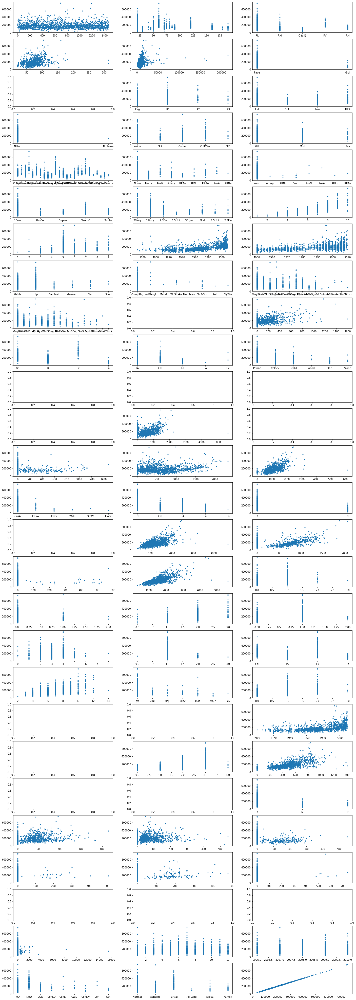

In [70]:
columns = train_data.columns
plt.figure(figsize=(24, 72))
for i, col in enumerate(columns):
    try:
        ax = plt.subplot(27, 3, i+1)
        ax.plot(train_data[col], train_data["SalePrice"], '.')
    except:
        pass
        # print(col)
plt.show()

## 상관관계 분석

In [3]:
import math

def price_category(price):
    if math.isnan(price):
        return -1
    return math.floor(price / 10000) * 10000

In [4]:
import copy
df_category = copy.deepcopy(train_data)
df_category["SalePrice"] = train_data["SalePrice"].apply(price_category)
df_category

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,200000
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,180000
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,220000
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,170000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,260000
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,140000


In [5]:
df_category.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
# null 개수가 100개 보다 많으면 그냥 column 삭제
# 나머지 row 삭제
columns = train_data.columns
for col in columns:
    naSum = df_category[col].isna().sum()
    if naSum > 100:
        df_category.drop(columns=col, inplace=True)
df_category.dropna(inplace=True)
df_category.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1338 entries, 0 to 1459
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1338 non-null   int64  
 1   MSSubClass     1338 non-null   int64  
 2   MSZoning       1338 non-null   object 
 3   LotArea        1338 non-null   int64  
 4   Street         1338 non-null   object 
 5   LotShape       1338 non-null   object 
 6   LandContour    1338 non-null   object 
 7   Utilities      1338 non-null   object 
 8   LotConfig      1338 non-null   object 
 9   LandSlope      1338 non-null   object 
 10  Neighborhood   1338 non-null   object 
 11  Condition1     1338 non-null   object 
 12  Condition2     1338 non-null   object 
 13  BldgType       1338 non-null   object 
 14  HouseStyle     1338 non-null   object 
 15  OverallQual    1338 non-null   int64  
 16  OverallCond    1338 non-null   int64  
 17  YearBuilt      1338 non-null   int64  
 18  YearRemo

In [24]:
# 상관관계 정도입니다.
# https://nittaku.tistory.com/456
# 단조성 평가 (KROCC)
KROCC = df_category.corrwith(df_category['SalePrice'], method='kendall').drop(['SalePrice']).sort_values(ascending=False).head(5)
KROCC

OverallQual    0.676760
GarageCars     0.569361
GrLivArea      0.560280
FullBath       0.548308
YearBuilt      0.473782
dtype: float64

In [25]:
# 선형성 평가 (PLCC)
PLCC = df_category.corrwith(df_category['SalePrice'], method='pearson').drop(['SalePrice']).sort_values(ascending=False).head(5)
PLCC

OverallQual    0.783415
GrLivArea      0.712393
GarageCars     0.641110
GarageArea     0.607964
1stFlrSF       0.605725
dtype: float64

In [26]:
# 단조성 평가 (SROCC)
SROCC = df_category.corrwith(df_category['SalePrice'], method='spearman').drop(['SalePrice']).sort_values(ascending=False).head(5)
SROCC

OverallQual    0.803237
GrLivArea      0.735821
GarageCars     0.670642
FullBath       0.656006
YearBuilt      0.643432
dtype: float64

## Pandas에서 반복문
iterrow() < pd.loc[] < pd.apply()
- 저는 pd.loc[]를 사용해보겠습니다

In [86]:
# config
METHOD = KROCC # PLCC, KROCC, SROCC
SIMILAR_COUNT = 5 # 비슷한 것 몇개를 추출할 것인가
FILE_NAME = "KROCC"

In [87]:
# submission file create
submission = pd.DataFrame(data = {'Id': [], 'SalePrice': []})
# print(submission)
for index in test_data.index:
    total_similar_score = 0
    for col in METHOD.index:
        colType = train_data[col].dtype
        if (colType == np.int64 or colType == np.float64):
            W = METHOD[col]
            similar_score = abs(train_data[col] - test_data.loc[index, col])
            # 정규화
            similar_score = (1 - (similar_score - similar_score.min()) / (similar_score.max() - similar_score.min())) * W
            total_similar_score += similar_score
            # print((test_data[col] - train_data[col]) * weight)
    similar_index = total_similar_score.sort_values(ascending=False).head(SIMILAR_COUNT).index
    submission.loc[index] = [int(index) + 1461, train_data.loc[similar_index]['SalePrice'].mean()]

submission['Id'] = submission['Id'].astype('int64')
print(submission['Id'])
submission.to_csv(FILE_NAME + ".csv", index=False)

0       1461
1       1462
2       1463
3       1464
4       1465
        ... 
1454    2915
1455    2916
1456    2917
1457    2918
1458    2919
Name: Id, Length: 1459, dtype: int64


In [70]:
print(test_data.index)

RangeIndex(start=0, stop=1459, step=1)


3